In [1]:
import zipfile

zip_file_path = "/content/drive/MyDrive/Practicum_Autonomous/TUMsimulator/Dataset2.zip"  # Replace with the actual zip file path
destination_folder = "/content/Simulator"  # Replace with the desired destination folder

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(destination_folder)

In [2]:
from torch import nn
from torchvision import models

def resnet_model(weights='ResNet50_Weights.IMAGENET1K_V2'):
    model = models.resnet50(weights = weights)
    model.fc = nn.Sequential(nn.Linear(in_features=2048, out_features=3), nn.Tanh())
    return model

In [3]:
import os
import pandas as pd
# READ DATASET

data_path = '/content/Simulator/Dataset2/VehicleData.txt'
folder_dir = os.path.dirname(data_path)

with open(data_path, 'r') as f:
  lines = f.readlines()

dataset = []
for data in lines:
  img_path, throttle, brakes, steering =  data.strip('\n').split(' ')
  img_path = img_path.strip("/")
  dataset.append([img_path, int(throttle), int(brakes), int(steering)])

df = pd.DataFrame(dataset, columns=['image_path', 'throttle', 'brakes', 'steering'])



<Axes: ylabel='Frequency'>

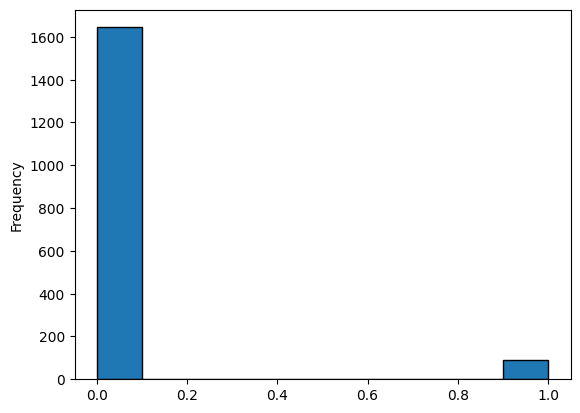

In [4]:
df['throttle'].plot(kind='hist', edgecolor='black')

<Axes: ylabel='Frequency'>

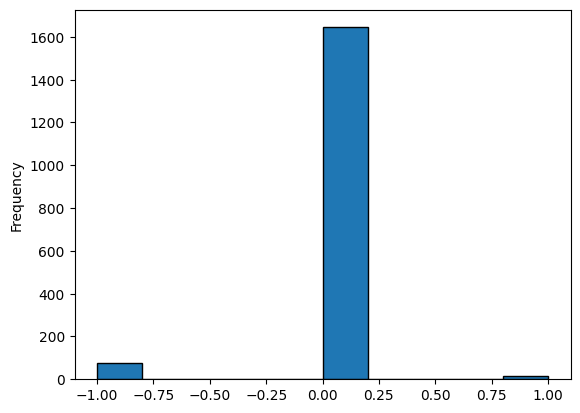

In [5]:
df['steering'].plot(kind='hist', edgecolor='black')

In [6]:
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset

from google.colab.patches import cv2_imshow

def random_contrast(image, min_factor=0.5, max_factor=1.5):
    # Generate a random contrast factor within the specified range
    contrast_factor = np.random.uniform(min_factor, max_factor)

    # Adjust the pixel intensity values using the contrast factor
    adjusted_image = cv2.convertScaleAbs(image, alpha=contrast_factor, beta=0)

    return adjusted_image

def random_brightness(image, min_value=-100, max_value=100):
    # Generate a random brightness value within the specified range
    brightness_value = np.random.randint(min_value, max_value + 1)

    # Adjust the pixel intensity values using the brightness value
    adjusted_image = np.clip(image.astype(np.int16) + brightness_value, 0, 255).astype(np.uint8)

    return adjusted_image

class SimulatorDataset(Dataset):
    def __init__(self, data_path, phase='train'):

      self.folder_dir = os.path.dirname(data_path)
      print("reading: ", data_path)
      with open(data_path, 'r') as f:
          self.lines = f.readlines()

    def __len__(self):
        return len(self.lines)

    def __getitem__(self, idx):
        img, a, b, c = self.lines[idx].strip('\n').split(' ')
        img = img.strip("/")
        img = cv2.imread(os.path.join(self.folder_dir, img))
        print("Before:")
        cv2_imshow(img)
        img = cv2.resize(img, (540, 80))

        # Apply random contrast to the image
        img = random_contrast(img)
        img = random_brightness(img)
        print("After:")
        cv2_imshow(img)
        img = img.astype(np.float32)/255
        img = torch.from_numpy(img).permute(2,0,1)
        print(img.shape)


        return img, torch.from_numpy(np.array([a, b, c]).astype(np.float32))

reading:  /content/Simulator/Dataset2/VehicleData.txt
Before:


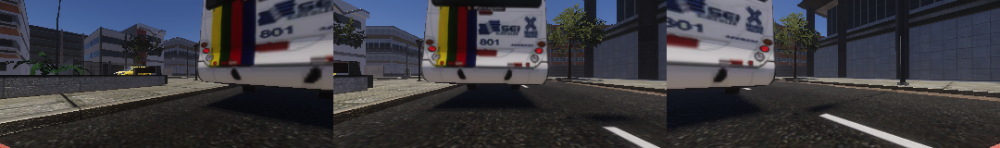

After:


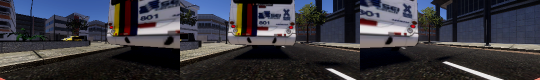

torch.Size([3, 80, 540])


(tensor([[[0.2824, 0.1725, 0.1647,  ..., 0.1176, 0.0784, 0.0588],
          [0.0745, 0.1490, 0.1804,  ..., 0.0275, 0.0314, 0.0314],
          [0.0627, 0.0627, 0.0627,  ..., 0.0353, 0.0353, 0.0353],
          ...,
          [0.1843, 0.1098, 0.0902,  ..., 0.1137, 0.0980, 0.1961],
          [0.3804, 0.4039, 0.2667,  ..., 0.3137, 0.5098, 0.4902],
          [0.2980, 0.3608, 0.3647,  ..., 0.4745, 0.4706, 0.4588]],
 
         [[0.2275, 0.1255, 0.1255,  ..., 0.0902, 0.0588, 0.0431],
          [0.0824, 0.1412, 0.1451,  ..., 0.0157, 0.0235, 0.0275],
          [0.0745, 0.0745, 0.0745,  ..., 0.0275, 0.0275, 0.0235],
          ...,
          [0.2157, 0.1294, 0.1098,  ..., 0.1255, 0.1020, 0.2118],
          [0.4431, 0.4627, 0.3137,  ..., 0.3569, 0.5882, 0.5647],
          [0.3451, 0.4235, 0.4275,  ..., 0.5529, 0.5451, 0.5373]],
 
         [[0.2235, 0.1255, 0.1255,  ..., 0.0745, 0.0471, 0.0353],
          [0.1569, 0.1922, 0.1843,  ..., 0.0157, 0.0235, 0.0235],
          [0.1608, 0.1647, 0.1647,  ...,

In [7]:
dataset = SimulatorDataset(data_path = '/content/Simulator/Dataset2/VehicleData.txt')

dataset[0]

Using device: cpu
reading:  /content/Simulator/Dataset2/VehicleData.txt
Training dataset size: 1387
Validation dataset size: 347


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 78.1MB/s]


Before:


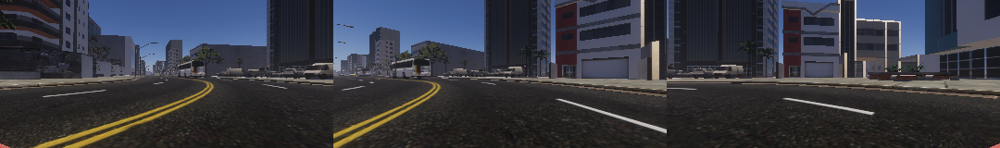

After:


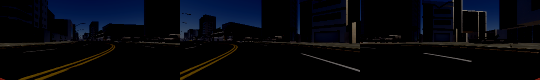

torch.Size([3, 80, 540])
Before:


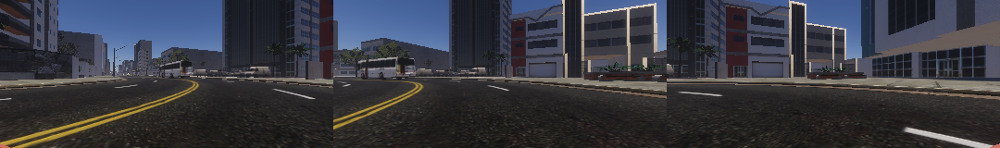

After:


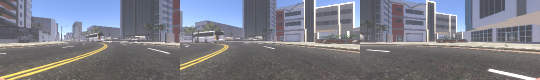

torch.Size([3, 80, 540])
Before:


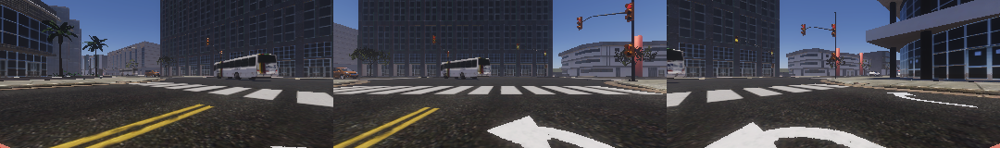

After:


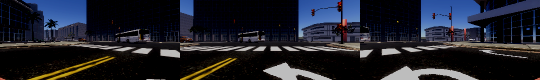

torch.Size([3, 80, 540])
Before:


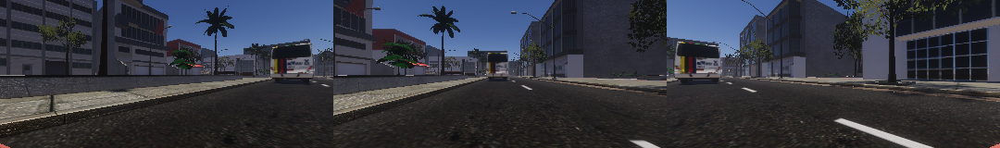

After:


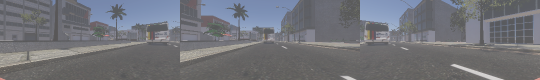

torch.Size([3, 80, 540])
Before:


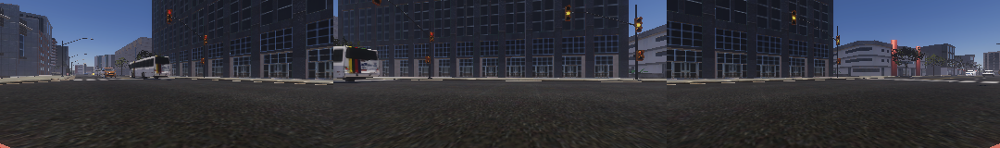

After:


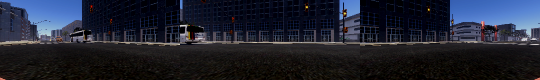

torch.Size([3, 80, 540])
Before:


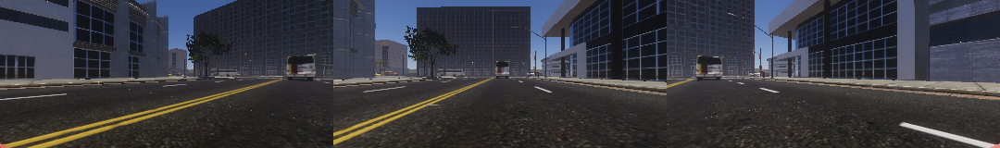

After:


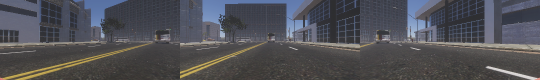

torch.Size([3, 80, 540])
Before:


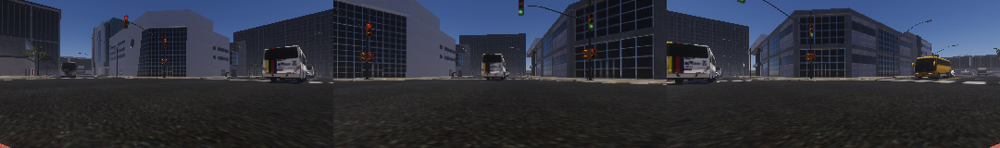

After:


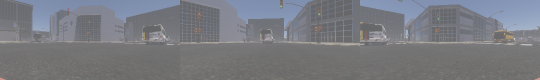

torch.Size([3, 80, 540])
Before:


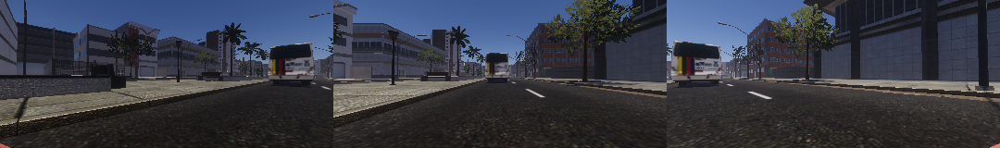

After:


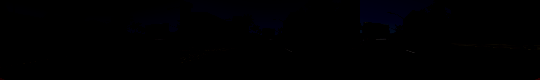

torch.Size([3, 80, 540])
Before:


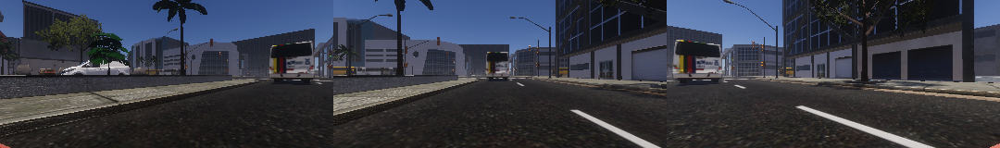

After:


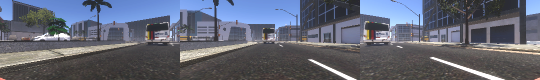

torch.Size([3, 80, 540])
Before:


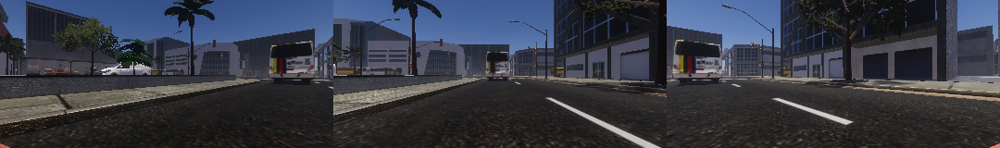

After:


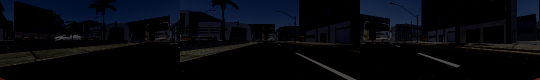

torch.Size([3, 80, 540])
Before:


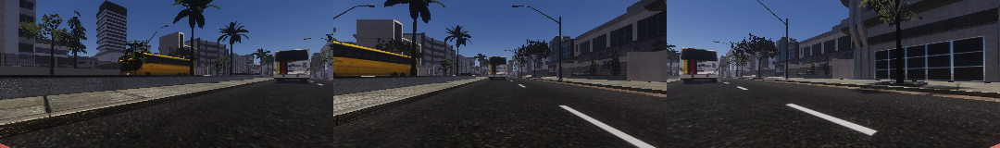

After:


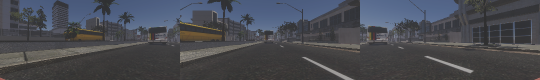

torch.Size([3, 80, 540])
Before:


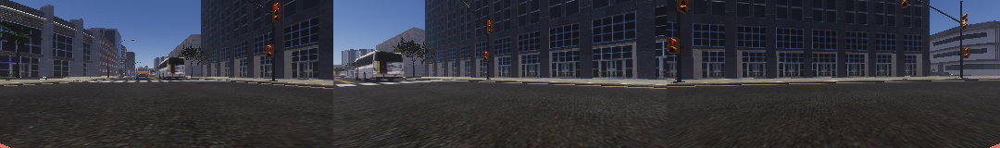

After:


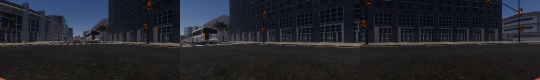

torch.Size([3, 80, 540])
Before:


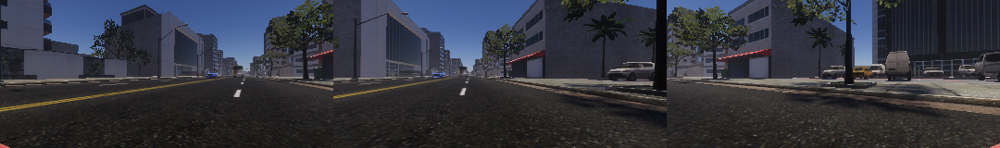

After:


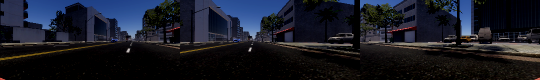

torch.Size([3, 80, 540])
Before:


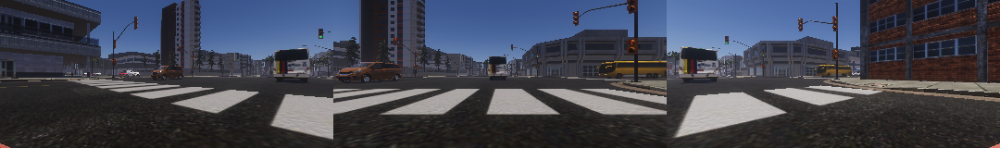

After:


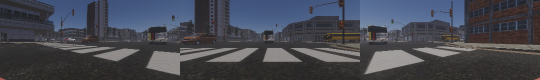

torch.Size([3, 80, 540])
Before:


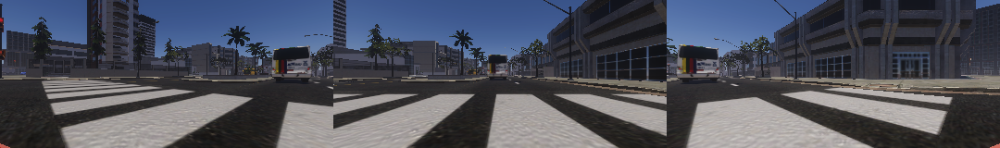

After:


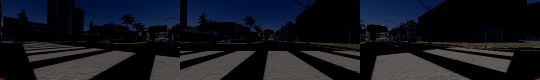

torch.Size([3, 80, 540])
Before:


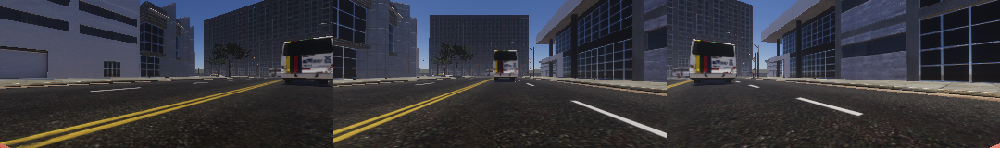

After:


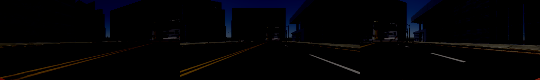

torch.Size([3, 80, 540])
Before:


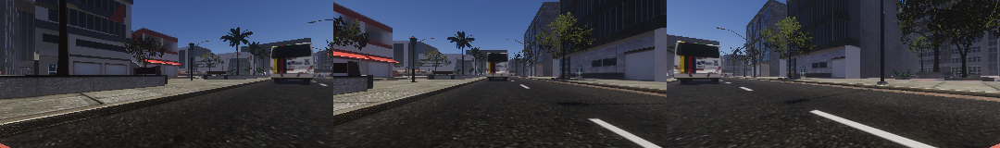

After:


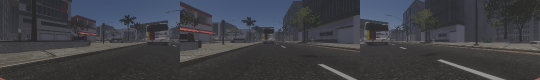

torch.Size([3, 80, 540])
Before:


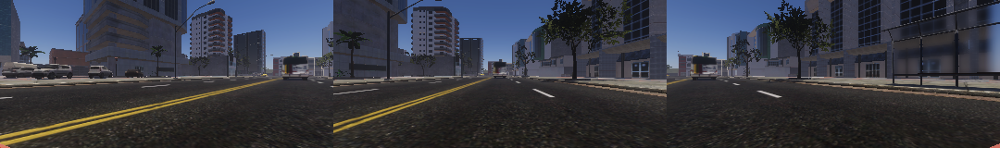

After:


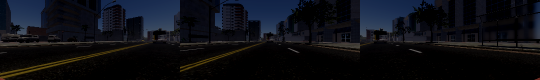

torch.Size([3, 80, 540])
Before:


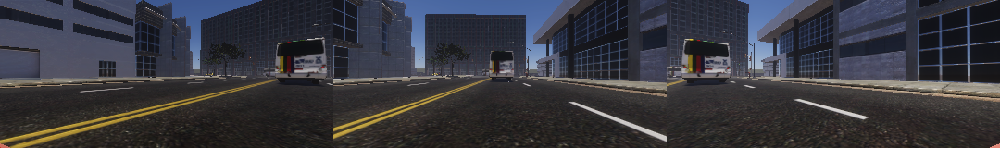

After:


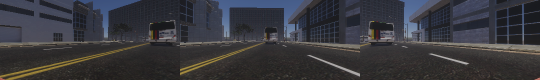

torch.Size([3, 80, 540])
Before:


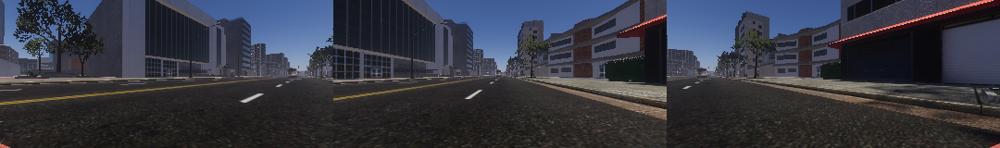

After:


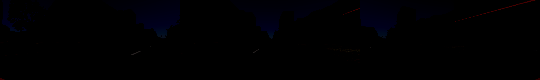

torch.Size([3, 80, 540])
Before:


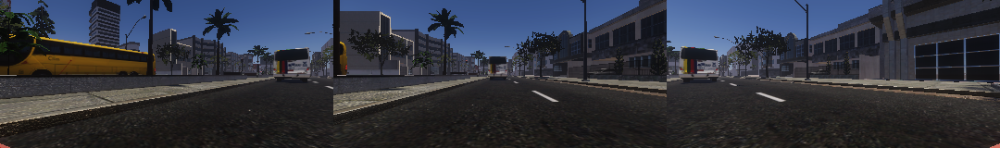

After:


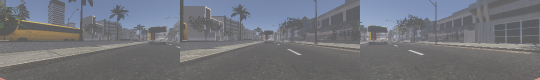

torch.Size([3, 80, 540])
Before:


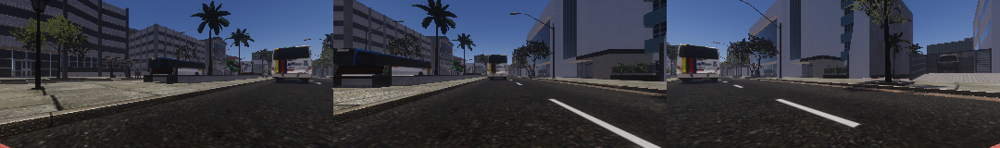

After:


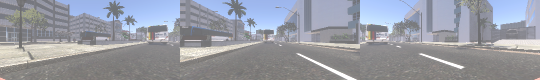

torch.Size([3, 80, 540])
Before:


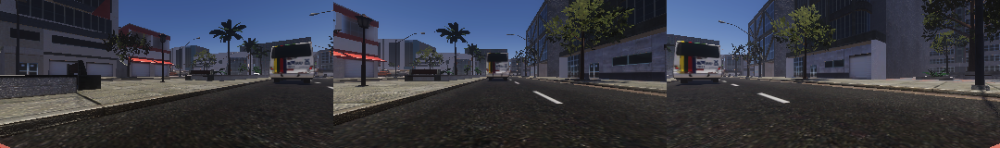

After:


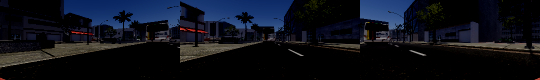

torch.Size([3, 80, 540])
Before:


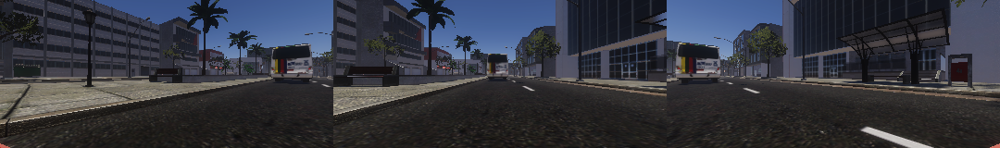

After:


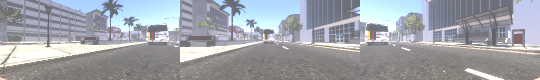

torch.Size([3, 80, 540])
Before:


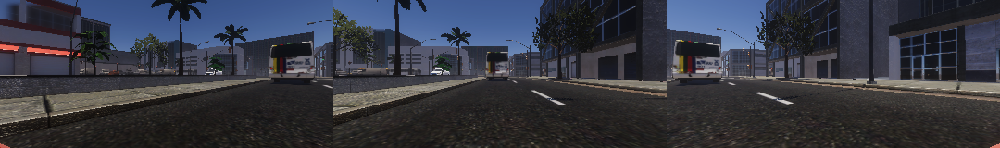

After:


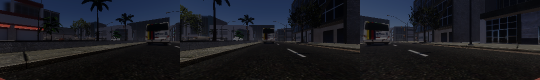

torch.Size([3, 80, 540])
Before:


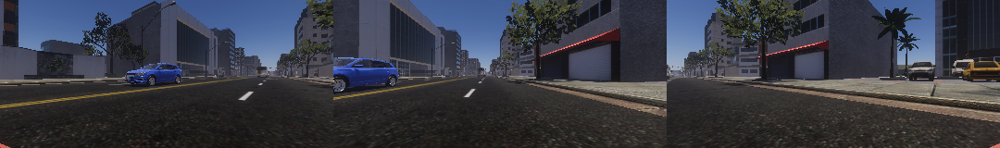

After:


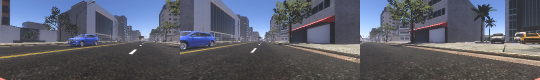

torch.Size([3, 80, 540])
Before:


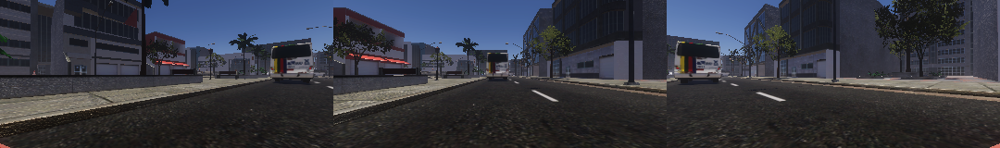

After:


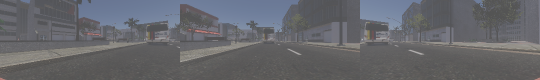

torch.Size([3, 80, 540])
Before:


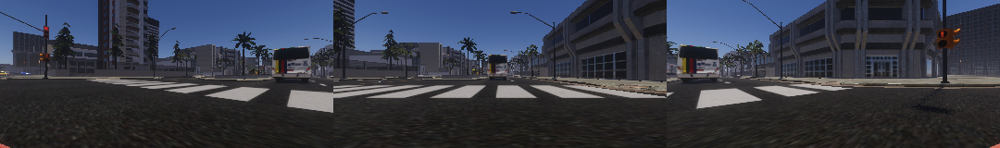

After:


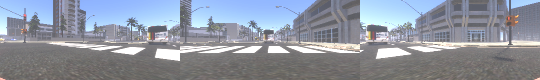

torch.Size([3, 80, 540])
Before:


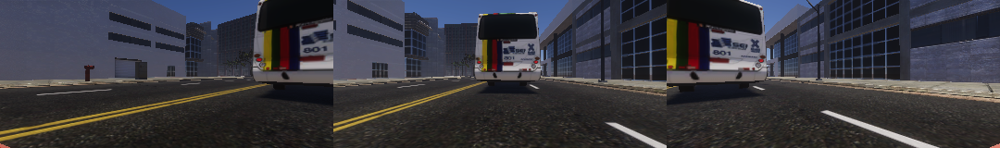

After:


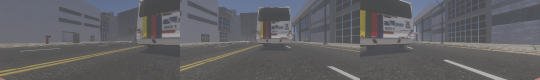

torch.Size([3, 80, 540])
Before:


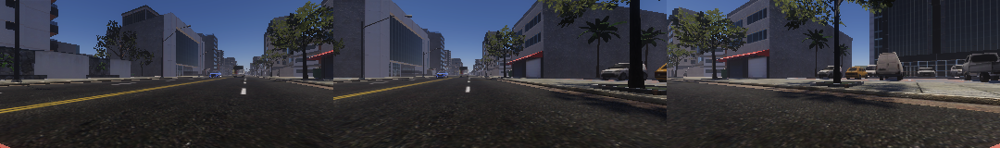

After:


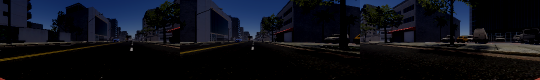

torch.Size([3, 80, 540])
Before:


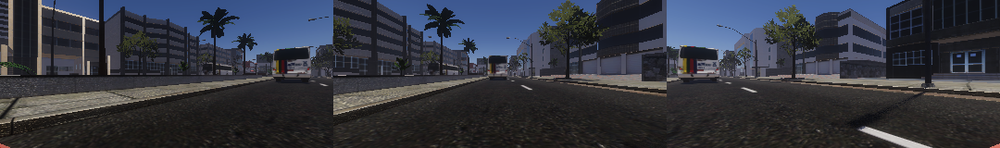

After:


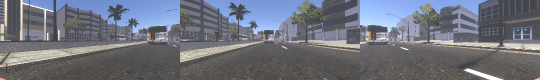

torch.Size([3, 80, 540])
Before:


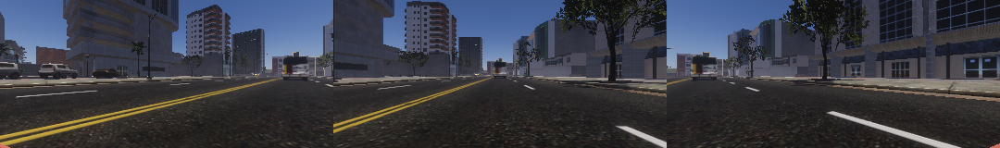

After:


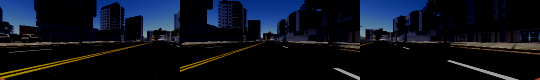

torch.Size([3, 80, 540])


KeyboardInterrupt: ignored

In [8]:
import sys
sys.path.append('.')

import os
import argparse

import torch
from torch.utils.data import DataLoader, random_split


def train_val(cfg):
    # device = "mps" if torch.backends.mps.is_available() else "cpu"
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    print(f"Using device: {device}")

    dataset = SimulatorDataset(data_path = cfg["data"])
    # val_data = SimulatorDataset(data_path = cfg.val_data)

    # Define the lengths for the split datasets
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size

    train_data, val_data = random_split(dataset, [train_size, val_size])
    print("Training dataset size:", len(train_data))
    print("Validation dataset size:", len(val_data))

    train_dataloader = DataLoader(train_data, batch_size=cfg["batch_size"], shuffle=True, num_workers=cfg["num_workers"], pin_memory=True)
    val_dataloader = DataLoader(val_data, batch_size=cfg["batch_size"], shuffle=False, num_workers=cfg["num_workers"], pin_memory=True)

    model = resnet_model().to(device=device)

    optimizer = torch.optim.SGD(model.parameters(), lr=cfg["learning_rate"])

    loss_function = torch.nn.MSELoss()

    for epoch_i in range(cfg["epochs"]):
        model.train()
        loss = 0.0
        for train_i, (input, target) in enumerate(train_dataloader):
            input, target = input.to(device), target.to(device)

            optimizer.zero_grad()
            input = input.type(torch.float32)
            output = model(input)
            loss = loss_function(output, target)

            loss += loss.item()

            loss.backward()
            optimizer.step()
        model.eval()
        with torch.no_grad():
            loss_sum = 0
            for val_i, (input, target) in enumerate(val_dataloader):
                input, target = input.to(device), target.to(device)
                input = input.type(torch.float32)
                output = model(input)
                loss_sum = loss_sum + loss_function(output, target)
        print(f"Epoch: {epoch_i+1}, train_loss: {loss/(train_i+1)} val_loss: {loss_sum.item()/(val_i+1)}")
        torch.save(model, cfg["save_path"]+'/'+ 'resnet_' + str(epoch_i + 1)+'.pt')
        torch.cuda.empty_cache()


if __name__ == '__main__':
    cfg = {
        "epochs" : 15,
        "data": '/content/Simulator/Dataset2/VehicleData.txt',
        "device": "gpu",
        "batch_size": 32,
        "learning_rate": 0.001,
        "num_workers": 0,
        "save_path": "/content/Simulator"
    }

    train_val(cfg)